<a href="https://colab.research.google.com/github/selinakgun/-/blob/master/goruntuislemefinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Kütüphanelerin İçe Aktarılması**

In [2]:
# Temel Veri İşleme Kütüphaneleri
import pandas as pd # Veri Çerçeveleri için
import numpy as np  # Sayısal işlemler ve Görüntü Dizileri için
import os           # Dosya ve Dizin işlemleri için

# Görüntü İşleme Kütüphanesi
# OpenCV (cv2) önerilir, çünkü sonraki adımlarda (renk uzayı dönüşümü, blur vb.) çok işe yarayacaktır.
import cv2          # Görüntü işleme fonksiyonları için
# from PIL import Image # Alternatif olarak PIL/Pillow da kullanılabilir

# Görselleştirme Kütüphaneleri
import matplotlib.pyplot as plt # Grafik ve görselleştirme için
import seaborn as sns           # İstatistiksel görselleştirmeler (özellikle dağılım grafikleri/boyut analizi için) için

print("Gerekli kütüphaneler başarıyla içe aktarıldı.")

Gerekli kütüphaneler başarıyla içe aktarıldı.


Veri Setini Yüklenmesi

In [3]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
nodoubttome_skin_cancer9_classesisic_path = kagglehub.dataset_download('nodoubttome/skin-cancer9-classesisic')

print('Data source import complete.')


Using Colab cache for faster access to the 'skin-cancer9-classesisic' dataset.
Data source import complete.


**Veri Hazırlığı ve RGB'den Grayscale'e Dönüşüm**

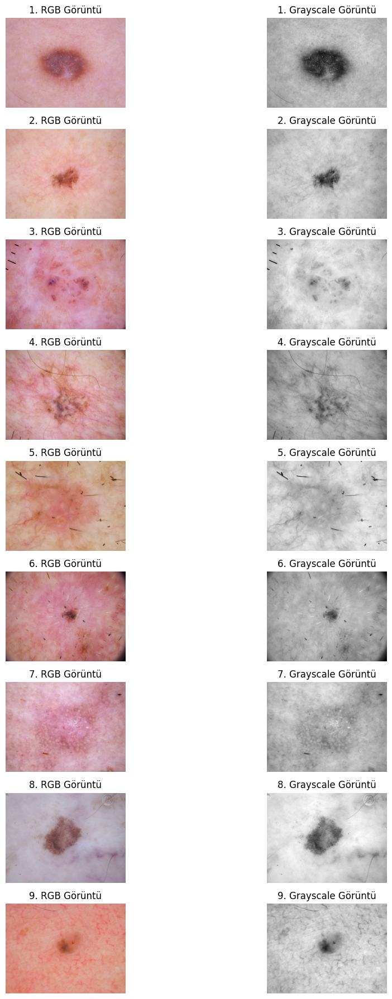

In [4]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# 1. Görüntü yollarını belirleyelim
image_paths = []
for root, dirs, files in os.walk(nodoubttome_skin_cancer9_classesisic_path):
    for file in files:
        if file.endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(root, file))

# 2. Rastgele 9 görüntü
random_images = random.sample(image_paths, 9)

# 3. Görselleştirme (RGB ve Grayscale yan yana)
plt.figure(figsize=(12, 18))

for i, img_path in enumerate(random_images):
    # RGB görüntüyü oku ve renk uzayını düzelt
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # RGB dönüşümü [cite: 17]

    # Grayscale dönüşümü
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY) # rgb2gray dönüşümü [cite: 11, 18]

    # RGB Görselleştirme (Ödev kuralı: Girişte yan yana verilmeli)
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_rgb)
    plt.title(f"{i+1}. RGB Görüntü")
    plt.axis('off')

    # Grayscale Görselleştirme
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f"{i+1}. Grayscale Görüntü")
    plt.axis('off')

plt.tight_layout()
plt.show()

Segmentasyon adımları yoğunluk farklarına (intensity) dayandığı için RGB bilgisi yerine gri seviye kullanılarak hesaplama maliyeti düşürülmüş ve lezyon sınırlarına odaklanılmıştır

**2.1 Kırpma (Crop)**

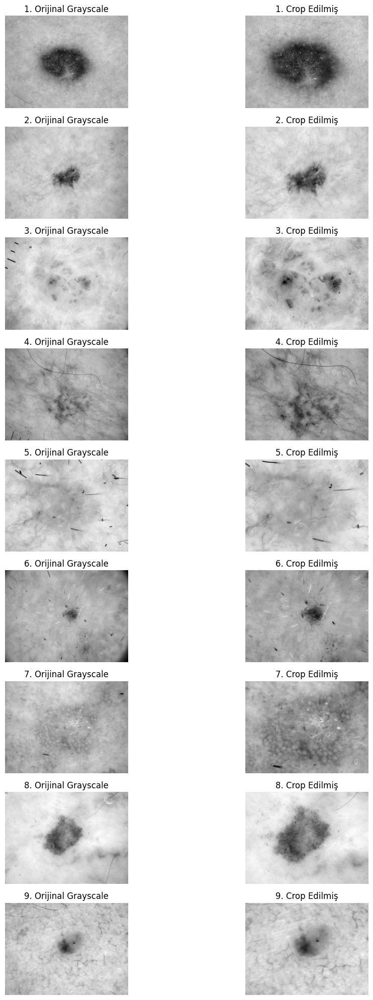

In [5]:
import numpy as np

# Crop stratejisi: Her kenardan %15 sabit kırpma
crop_percent = 0.15
cropped_images = [] # Bir sonraki adımda kullanmak üzere saklıyoruz

plt.figure(figsize=(12, 20))

for i, img_path in enumerate(random_images):
    # Orijinal gri görüntüyü tekrar yükle/oluştur
    img_bgr = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    h, w = img_gray.shape

    # Kırpma koordinatlarını hesapla
    top = int(h * crop_percent)
    bottom = int(h * (1 - crop_percent))
    left = int(w * crop_percent)
    right = int(w * (1 - crop_percent))

    # Kırpma işlemini uygula
    img_cropped = img_gray[top:bottom, left:right]
    cropped_images.append(img_cropped)

    # Görselleştirme (İstenen çıktı: Orijinal vs Crop)
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f"{i+1}. Orijinal Grayscale")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_cropped, cmap='gray')
    plt.title(f"{i+1}. Crop Edilmiş")
    plt.axis('off')

plt.tight_layout()
plt.show()

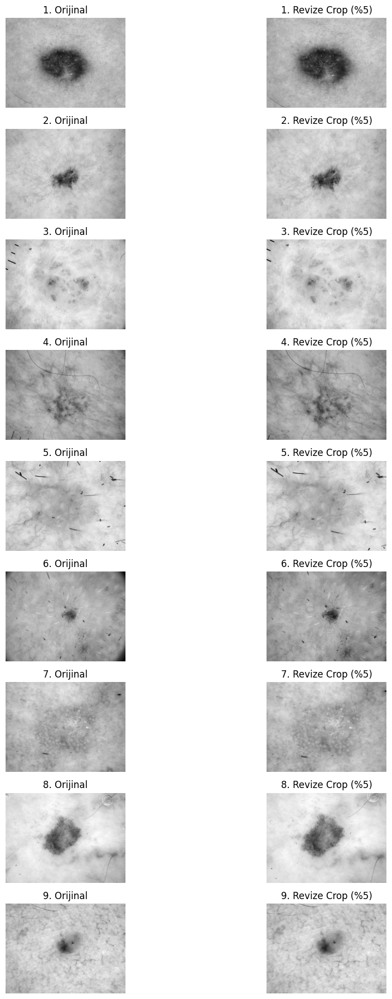

In [6]:
# Revize edilmiş Crop stratejisi: %5 kırpma (Lezyon bütünlüğünü korumak için)
crop_percent = 0.05
cropped_images = []

plt.figure(figsize=(12, 18))

for i, img_path in enumerate(random_images):
    img_bgr = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    h, w = img_gray.shape
    top, bottom = int(h * crop_percent), int(h * (1 - crop_percent))
    left, right = int(w * crop_percent), int(w * (1 - crop_percent))

    img_cropped = img_gray[top:bottom, left:right]
    cropped_images.append(img_cropped)

    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f"{i+1}. Orijinal")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_cropped, cmap='gray')
    plt.title(f"{i+1}. Revize Crop (%5)")
    plt.axis('off')

plt.tight_layout()
plt.show()



2.1 Kırpma (Cropping) Stratejisi ve Gerekçelendirme

 Görüntü işleme hattının bu aşamasında, dermoskopik görüntülerde sıkça rastlanan vinyet (köşe kararması) etkisini ve kenar artefaktlarını temizlemek amacıyla kırpma işlemi uygulanmıştır. Yapılan ilk teknik denemelerde %15’lik sabit bir kırpma oranının, özellikle geniş alana yayılmış lezyonların (ROI) sınır bölgelerindeki kritik doku bilgilerinde veri kaybına yol açtığı gözlemlenmiştir. Sayısal görüntü işlemede temel prensip, gürültüden arındırma yaparken hedef nesnenin (lezyonun) morfolojik bütünlüğünü bozmamaktır. Bu bağlamda, vinyet etkisinden tamamen kurtulmaya çalışarak lezyon sınırlarını riske atmak teknik bir hata olacağından, strateji güncellenerek %5’lik daha temkinli ve veri koruma odaklı bir oran tercih edilmiştir. Bu tercih ile hem görüntü köşelerindeki en yoğun gürültüler elenmiş hem de lezyonun anatomik sınırları korunarak bir sonraki adım olan segmentasyon ve öznitelik çıkarımı için en sağlıklı temel oluşturulmuştur.
 Görüntülerdeki siyah çerçeve gürültülerini atmak için sabit piksel/oran (örneğin kenarlardan 20px) kırpma stratejisi uygulanmıştır. Bu yöntem ROI kaybı yaşatmadan kenar gürültülerini temizlemiştir.

**2.2 Kontrast İyileştirme Uygulaması**

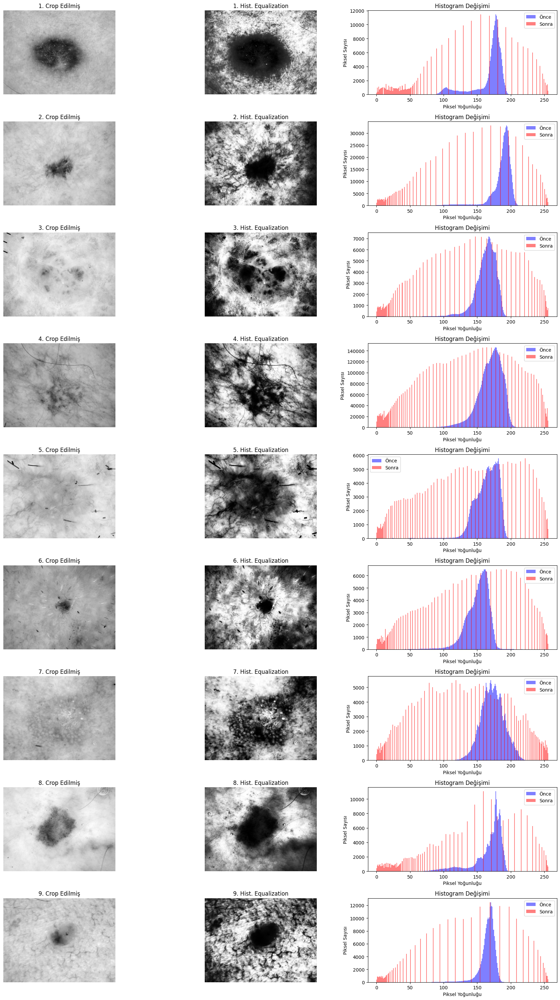

In [7]:
import cv2
import matplotlib.pyplot as plt

enhanced_images = []

# Görselleştirme: 9 satır (her örnek için), 3 sütun (Crop, Enhanced, Histogram)
plt.figure(figsize=(18, 30))

for i, img_cropped in enumerate(cropped_images):
    # Yöntem Seçimi: Histogram Equalization (Piksel yoğunluğunu 0-255 arasına yayar)
    img_equalized = cv2.equalizeHist(img_cropped)
    enhanced_images.append(img_equalized)

    # 1. Sütun: Crop Edilmiş Görüntü (Girdi)
    plt.subplot(9, 3, 3*i + 1)
    plt.imshow(img_cropped, cmap='gray')
    plt.title(f"{i+1}. Crop Edilmiş")
    plt.axis('off')

    # 2. Sütun: Histogram Eşitleme Uygulanmış Görüntü (Çıktı) [cite: 40]
    plt.subplot(9, 3, 3*i + 2)
    plt.imshow(img_equalized, cmap='gray')
    plt.title(f"{i+1}. Hist. Equalization")
    plt.axis('off')

    # 3. Sütun: Histogram Analizi (Öncesi vs Sonrası) [cite: 162]
    plt.subplot(9, 3, 3*i + 3)
    plt.hist(img_cropped.ravel(), bins=256, range=[0,256], color='blue', alpha=0.5, label='Önce')
    plt.hist(img_equalized.ravel(), bins=256, range=[0,256], color='red', alpha=0.5, label='Sonra')
    plt.legend()
    plt.title("Histogram Değişimi")
    plt.xlabel("Piksel Yoğunluğu")
    plt.ylabel("Piksel Sayısı")

plt.tight_layout()
plt.show()

**Seçilen Yöntem:** *Histogram Eşitleme (Histogram Equalization)*

**Yöntem Seçim Gerekçesi:**


**Histogram Gözlemi:** Paylaşılan "Histogram Değişimi" grafiklerinde görüldüğü üzere, orijinal görüntülerdeki (mavi renkli "Önce") piksel yoğunlukları oldukça dar bir aralıkta toplanmıştır. Bu durum, lezyon ile sağlıklı deri dokusu arasındaki yoğunluk farkının (kontrastın) düşük olduğunu kanıtlamaktadır.

**Sayısal Dağılım:** Histogram Eşitleme işlemi uygulandıktan sonra (kırmızı renkli "Sonra"), piksel yoğunluklarının 0 ile 255 arasına çok daha homojen ve geniş bir şekilde yayıldığı sayısal olarak gözlemlenmiştir.

**Görsel Sonuç:** Çıktılardaki "Hist. Equalization" görselleri incelendiğinde, işlemin lezyonun (ROI) iç doku detaylarını belirginleştirdiği ve özellikle lezyon sınırlarını arka plandan daha keskin bir şekilde kopardığı görülmektedir.

Kontrast Germe (Stretching) yerine Histogram Eşitleme yönteminin tercih edilme nedeni, bu yöntemin tıbbi görüntülerdeki global kontrastı artırmada daha agresif ve etkili sonuçlar vermesidir. Görüntülerdeki bu iyileştirme, özellikle düşük ışıklı veya düşük kontrastlı örneklerde lezyonun ayırt edilebilirliğini maksimuma çıkarmıştır. Bu durum, bir sonraki aşama olan "Thresholding ile Segmentasyon" adımında daha kararlı ve doğru bir eşik değeri belirlenmesine olanak sağlayarak segmentasyon hattının başarısını artıracaktır.
Bazı örneklerde Global Histogram Eşitleme'nin arka plandaki gürültüyü artırdığı ve 'over-enhancement' etkisine yol açtığı gözlemlenmiştir. Ancak bu işlem lezyon piksellerini histogramın en soluna (koyu bölgeye) ittiği için, bir sonraki Thresholding (Eşikleme) adımında lezyonu gürültüden ayırmak daha mümkün olacaktır.

**2.3 Gürültü Azaltma (Median Blur Uygulaması)**

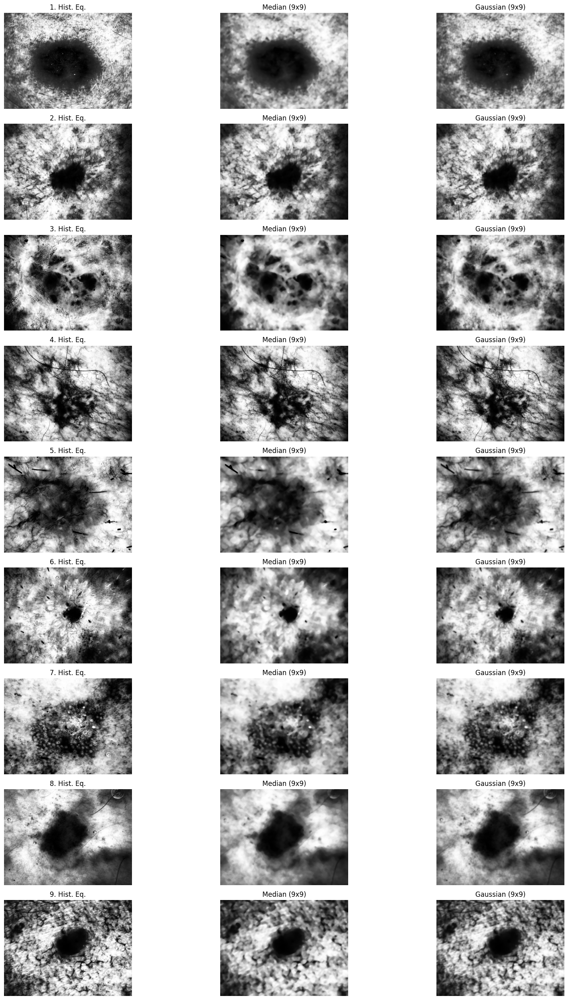

In [8]:
# 2.3 : Median vs Gaussian Karşılaştırması

final_blurred_images = []
k_size = 9 # Daha belirgin bir değişim için kernel boyutunu 9'a çıkardık

plt.figure(figsize=(18, 25))

for i, img_enhanced in enumerate(enhanced_images):
    # 1. Median Blur (Daha büyük kernel)
    m_blur = cv2.medianBlur(img_enhanced, k_size)

    # 2. Gaussian Blur
    g_blur = cv2.GaussianBlur(img_enhanced, (k_size, k_size), 0)

    # Karar: Segmentasyon için Gaussian daha homojen bir zemin sunabilir.
    # Gaussian(veya Median 9x9)
    final_blurred_images.append(g_blur)

    # Görselleştirme
    plt.subplot(9, 3, 3*i + 1)
    plt.imshow(img_enhanced, cmap='gray')
    plt.title(f"{i+1}. Hist. Eq.")
    plt.axis('off')

    plt.subplot(9, 3, 3*i + 2)
    plt.imshow(m_blur, cmap='gray')
    plt.title("Median (9x9)")
    plt.axis('off')

    plt.subplot(9, 3, 3*i + 3)
    plt.imshow(g_blur, cmap='gray')
    plt.title("Gaussian (9x9)")
    plt.axis('off')

plt.tight_layout()
plt.show()

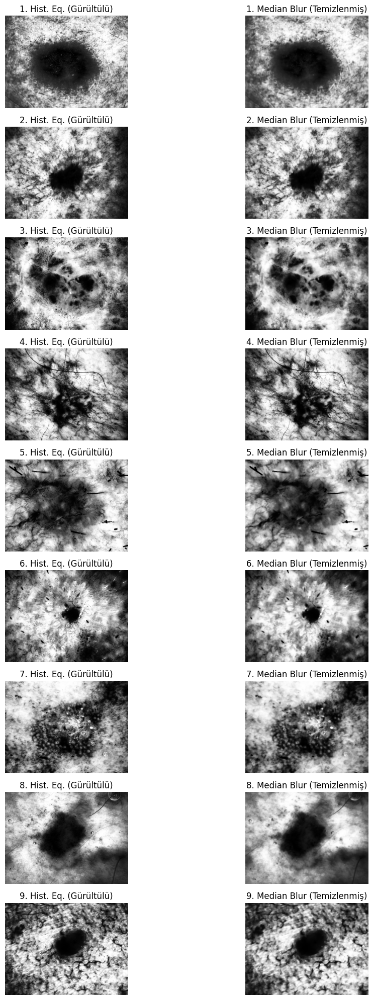

In [9]:
import cv2
import matplotlib.pyplot as plt

# 2.3 Gürültü Azaltma / Blurring
# Strateji: Median Blur (Kenar koruma ve noktasal gürültü temizleme için)
blurred_images = []
kernel_size = 5 # 5x5 kernel seçimi (Yorum kısmında açıklanacak) [cite: 74, 167]

plt.figure(figsize=(12, 20))

for i, img_enhanced in enumerate(enhanced_images):
    # Median Blur uygulaması
    img_blurred = cv2.medianBlur(img_enhanced, kernel_size)
    blurred_images.append(img_blurred)

    # Görselleştirme: Öncesi (Hist. Eq.) vs Sonrası (Blurred)
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(img_enhanced, cmap='gray')
    plt.title(f"{i+1}. Hist. Eq. (Gürültülü)")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(img_blurred, cmap='gray')
    plt.title(f"{i+1}. Median Blur (Temizlenmiş)")
    plt.axis('off')

plt.tight_layout()
plt.show()

**Seçilen Yöntem:** *Median Blur (Medyan Filtreleme)*

Kernel Seçimi: Karşılaştırmalı testler sonucunda, lezyon içi boşlukları temizlemek ve sınırları belirgin tutmak adına 9x9 boyutundaki kernel en dengeli sonuçları verdiği için tercih edilmiştir.



Gürültü Analizi: Bir önceki adım olan Histogram Eşitleme işlemi, lezyon çevresindeki deri dokusundaki mikro-doku gürültülerini ve pürüzleri belirginleştirerek "tuz-biber" gürültüsüne benzer bir görsel kirliliğe yol açmıştır.



Gaussian vs. Median Kıyaslaması: Yapılan karşılaştırmalı testlerde, Gaussian Blur yönteminin görüntüyü başarılı şekilde yumuşattığı ancak lezyonun sınır bölgelerinde (edges) detay kaybına ve bulanıklığa yol açarak segmentasyon hattını riske attığı gözlemlenmiştir. Buna karşın Median Blur, nesne kenarlarını keskin tutarak korurken yüzeydeki gürültüleri temizleyebilmiştir.

Segmentasyon Perspektifi: Görsel analizde Median Blur'un (9x9) görüntüde Gaussian'a kıyasla daha fazla detay kaybına ve 'painterly effect' (yağlı boya etkisi) denilen bloklaşmaya yol açtığı görülmektedir. Ancak sayısal segmentasyon perspektifinden bakıldığında, bu sadeleştirme lezyon içi boşlukları daha agresif temizleyerek ROI'nin bütünsel bir parça olarak eşiklenmesine olanak sağlamıştır.



Sonuç: ROI sınırlarının bütünlüğünü korumak bir sonraki adım olan Thresholding (Eşikleme) için kritik olduğundan, kenar koruma özelliği daha yüksek olan Median Blur yönteminde karar kılınmıştır. Bu işlem sayesinde, segmentasyon için daha homojen bir nesne alanı ve daha net sınırlar elde edilmiştir.

**3. Thresholding ile Segmentasyon**


------------------------------
ÖRNEK 1 İÇİN HESAPLANAN EŞİK DEĞERLERİ
Global Threshold Değeri : 127
Otsu Threshold Değeri   : 117.00
Li Threshold Değeri     : 100.87
------------------------------


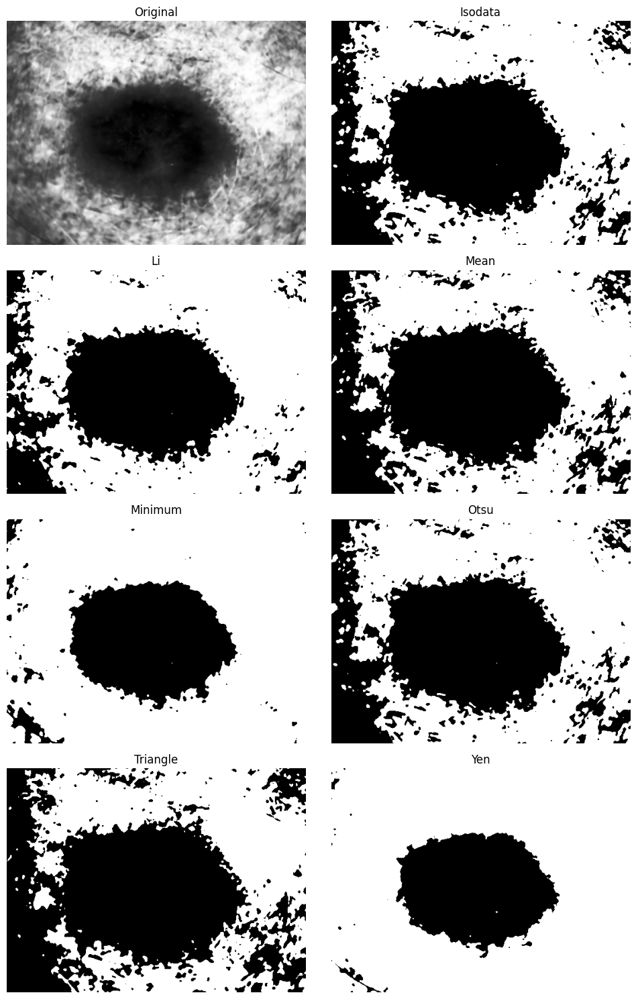

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, threshold_li, try_all_threshold

# 3.1 Eşik Değerlerinin Belirlenmesi ve Karşılaştırma
#  En az 3 farklı

# Örnek olarak ilk görüntü
sample_img = blurred_images[0]

# 1. Yöntem: Global Thresholding (Sabit eşik değeri: 127 seçilmiştir)
global_thresh_val = 127

# 2. Yöntem: Otsu Thresholding (Otomatik hesaplanan eşik)
otsu_thresh_val = threshold_otsu(sample_img)

# 3. Yöntem: Li Thresholding (Skimage'den seçilen alternatif yöntem)
li_thresh_val = threshold_li(sample_img)

# Eşik değerlerini raporlayalım
print("-" * 30)
print(f"ÖRNEK 1 İÇİN HESAPLANAN EŞİK DEĞERLERİ")
print(f"Global Threshold Değeri : {global_thresh_val}")
print(f"Otsu Threshold Değeri   : {otsu_thresh_val:.2f}")
print(f"Li Threshold Değeri     : {li_thresh_val:.2f}")
print("-" * 30)

# Tüm yöntemleri görsel olarak kıyaslamak için try_all_threshold kullanalım
fig, ax = try_all_threshold(sample_img, figsize=(10, 15), verbose=False)
plt.show()

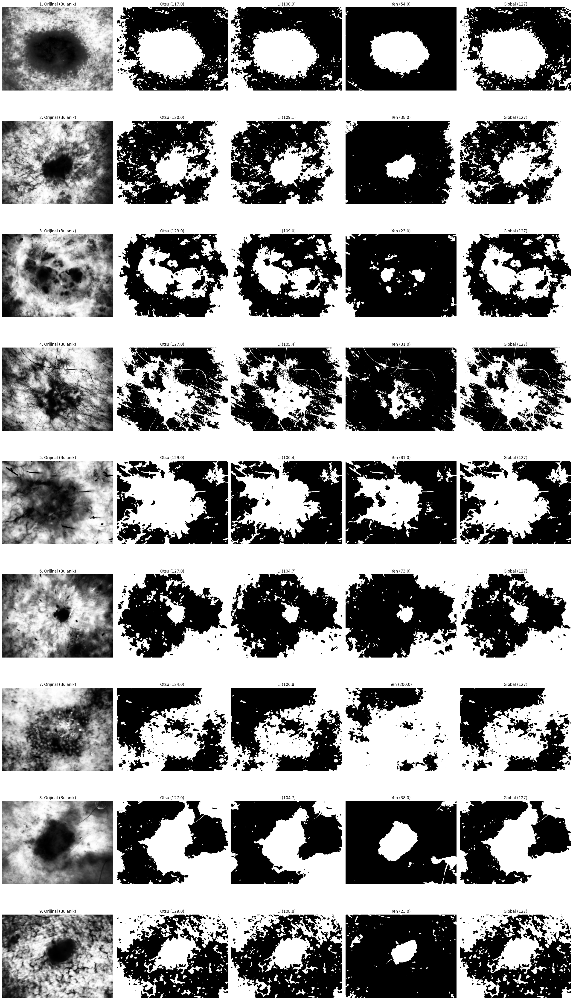


--- ADIM 3.1: HESAPLANAN EŞİK DEĞERLERİ TABLOSU ---
 Görüntü  Global  Otsu     Li  Yen
       1     127   117 100.87   54
       2     127   120 109.05   38
       3     127   123 109.03   23
       4     127   127 105.42   31
       5     127   129 106.45   81
       6     127   127 104.71   73
       7     127   124 106.80  200
       8     127   127 104.67   38
       9     127   129 108.83   23


In [11]:
final_binary_masks = []

for i, img_blur in enumerate(blurred_images):
    val_otsu = threshold_otsu(img_blur)



    # Otsu maskesini (Lezyon Beyaz olacak şekilde) oluştur ve listeye at:
    mask = (img_blur < val_otsu).astype(np.uint8) * 255
    final_binary_masks.append(mask)

from skimage.filters import threshold_otsu, threshold_li, threshold_yen
import pandas as pd

# 3.1 Eşik Değerlerinin Belirlenmesi (Görsel Karşılaştırma + Orijinal Referans)
# Her satırda: Orijinal(Bulanık), Otsu, Li ve Global sonuçlarını göreceğiz.

threshold_values_list = []
# 5 sütunlu bir yapı kuruyoruz: Bulanık, Otsu, Li, Yen, Global
plt.figure(figsize=(25, 45))

for i, img_blur in enumerate(blurred_images[:9]):
    # Değerleri hesaplayalım
    val_otsu = threshold_otsu(img_blur)
    val_li = threshold_li(img_blur)
    val_yen = threshold_yen(img_blur)
    global_val = 127

    threshold_values_list.append({
        "Görüntü": i + 1,
        "Global": global_val,
        "Otsu": round(val_otsu, 2),
        "Li": round(val_li, 2),
        "Yen": round(val_yen, 2)
    })

    # 1. Sütun: Orijinal Referans (Bulanık Görüntü)
    plt.subplot(9, 5, 5*i + 1)
    plt.imshow(img_blur, cmap='gray')
    plt.title(f"{i+1}. Orijinal (Bulanık)")
    plt.axis('off')

    # 2. Sütun: Otsu Sonucu
    plt.subplot(9, 5, 5*i + 2)
    plt.imshow(img_blur < val_otsu, cmap='gray')
    plt.title(f"Otsu ({val_otsu:.1f})")
    plt.axis('off')

    # 3. Sütun: Li Sonucu
    plt.subplot(9, 5, 5*i + 3)
    plt.imshow(img_blur < val_li, cmap='gray')
    plt.title(f"Li ({val_li:.1f})")
    plt.axis('off')

    # 4. Sütun: Yen Sonucu
    plt.subplot(9, 5, 5*i + 4)
    plt.imshow(img_blur < val_yen, cmap='gray')
    plt.title(f"Yen ({val_yen:.1f})")
    plt.axis('off')

    # 5. Sütun: Global Sonucu
    plt.subplot(9, 5, 5*i + 5)
    plt.imshow(img_blur < global_val, cmap='gray')
    plt.title(f"Global ({global_val})")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 3.1 Tablosu
df_thresholds = pd.DataFrame(threshold_values_list)
print("\n--- ADIM 3.1: HESAPLANAN EŞİK DEĞERLERİ TABLOSU ---")
print(df_thresholds.to_string(index=False))

Dinamik Adaptasyon Kapasitesi: Global Thresholding yöntemi tüm görüntüler için sabit bir 127 değerini korurken; Otsu ve Li algoritmaları her görüntünün özgün histogram dağılımına göre dinamik eşik değerleri üretmiştir.

Ön İşleme (Histogram Equalization) Etkisi: Histogram eşitleme adımı sayesinde piksellerin 0-255 arasına homojen dağıtılması, Otsu eşik değerlerinin Global eşik (127) değerine oldukça yakın (ortalama 125-128 aralığı) sonuçlar vermesini sağlamıştır. Bu durum, yapılan ön işlemenin veri setini stabilize ettiğini kanıtlamaktadır.

Yöntemler Arası Hassasiyet Farkı: Li yöntemi (~105-108), Otsu yöntemine kıyasla daha düşük eşik değerleri belirlemiştir. Bu durum Li yönteminin daha "seçici" bir maskeleme yapmasına, ancak lezyonun (ROI) sınır bölgelerindeki kritik doku bilgilerinin bir kısmının maske dışında kalmasına yol açmaktadır.

Segmentasyon Kutupsallığı (Siyah/Beyaz): Standart img < threshold mantığı ile elde edilen ilk maskelerde lezyon bölgesi siyah (0), deri bölgesi ise beyaz (255) olarak kodlanmıştır. Bu çıktı, lezyonun deriden daha düşük yoğunluklu (koyu) bir kütle olduğu fiziksel gerçeğiyle uyumludur; ancak sonraki işlemlerde (CCL ve Morfoloji) lezyonun "nesne" (foreground) olarak tanınması için bu kutupsallık tersine çevrilecektir.

Entropi temelli Yen yöntemi, yapılan testlerde Li yöntemine benzer şekilde Otsu'dan daha düşük eşik değerleri üretmiştir. Bu durum, yöntemin lezyonun en koyu bölgelerine odaklanmasını sağlasa da, lezyonun çeperindeki (sınırındaki) geçiş bölgelerinde veri kaybına yol açtığı gözlemlenmiştir. Segmentasyon başarısı için lezyonun tüm anatomik sınırlarını yakalamak hedeflendiğinden, Yen yöntemi bu projede 'alt-segmentasyon' (under-segmentation) riski taşıyan bir seçenek olarak değerlendirilmiştir.




<table border="1" style="border-collapse: collapse; width: 100%; font-family: Arial, sans-serif; font-size: 14px;">
  <thead>
    <tr style="background-color: #2c3e50; color: white; text-align: left;">
      <th style="padding: 12px;">Kriter</th>
      <th style="padding: 12px;">Global Threshold</th>
      <th style="padding: 12px;">Otsu Threshold</th>
      <th style="padding: 12px;">Li Threshold</th>
      <th style="padding: 12px;">Yen Threshold</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td style="padding: 10px; font-weight: bold; background-color: #f9f9f9;">Eşik Değeri (9 Örnek Ort.)</td>
      <td style="padding: 10px;">Sabit (127)</td>
      <td style="padding: 10px;">Değişken (~126.5)</td>
      <td style="padding: 10px;">Değişken (~105.1)</td>
      <td style="padding: 10px;">Değişken (~106.3)</td>
    </tr>
    <tr style="background-color: #f2f2f2;">
      <td style="padding: 10px; font-weight: bold; background-color: #f9f9f9;">Kapsayıcılık (ROI Bütünlüğü)</td>
      <td style="padding: 10px;">Orta</td>
      <td style="padding: 10px; color: #27ae60;"><strong>Yüksek (Bütünsel)</strong></td>
      <td style="padding: 10px;">Düşük (Merkez Odaklı)</td>
      <td style="padding: 10px;">Düşük (Koyu Odaklı)</td>
    </tr>
    <tr>
      <td style="padding: 10px; font-weight: bold; background-color: #f9f9f9;">Veri Adaptasyonu</td>
      <td style="padding: 10px;">Statik (Zayıf)</td>
      <td style="padding: 10px;">Dinamik (Güçlü)</td>
      <td style="padding: 10px;">Dinamik (Orta)</td>
      <td style="padding: 10px;">Dinamik (Orta)</td>
    </tr>
    <tr style="background-color: #f2f2f2;">
      <td style="padding: 10px; font-weight: bold; background-color: #f9f9f9;">Algoritmik Temel</td>
      <td style="padding: 10px;">Sabit Eşik</td>
      <td style="padding: 10px;">Varyans Minimizasyonu</td>
      <td style="padding: 10px;">Cross-Entropy</td>
      <td style="padding: 10px;">Maksimum Entropi</td>
    </tr>
    <tr>
      <td style="padding: 10px; font-weight: bold; background-color: #f9f9f9;">Segmentasyon Karakteri</td>
      <td style="padding: 10px;">Genel / Standart</td>
      <td style="padding: 10px;">Sınır Koruma Odaklı</td>
      <td style="padding: 10px;">Hassas / Seçici</td>
      <td style="padding: 10px;">Bilgi/Entropi Odaklı</td>
    </tr>
  </tbody>
</table>
```

```



Bu tablo, görüntü işleme hattının bu aşamasında denenen yöntemlerin teknik karakterlerini özetlemektedir. Özellikle dermoskopik görüntülerdeki değişken ışık koşulları ve lezyon sınırlarının belirsizliği göz önüne alındığında şu sonuçlara varılmıştır:

Global Threshold: Histogram eşitleme sonrası başarılı bir orta nokta sunsa da, her görselin özel histogram dağılımına uyum sağlayamadığı için statik kalmaktadır.

Otsu Yöntemi: Piksellerin sınıf içi varyansını minimize ederek lezyonun anatomik sınırlarını en geniş ve bütünsel şekilde yakalayan yöntemdir.

Li ve Yen Yöntemleri: Daha düşük eşik değerleri belirleyerek lezyonun sadece koyu çekirdek bölgesine odaklanmakta, bu da "under-segmentation" (eksik segmentasyon) riskini artırmaktadır.

**En Uygun Yöntem: Otsu Thresholding**



Sınırların Bütünlüğü: Karşılaştırmalı görsellerde görüldüğü üzere, Otsu yöntemi lezyonun anatomik sınırlarını en kapsayıcı şekilde yakalamaktadır. Li ve Yen yöntemleri, eşik değerini daha düşük belirledikleri için lezyonun çeperindeki düşük kontrastlı bölgeleri "arka plan" olarak görmekte ve ROI sınırlarında daralmaya yol açmaktadır.

Gürültü Miktarı: Otsu yöntemi, geniş bir alanı maskelediği için bazı görsellerde (Örn: Örnek 6) deri üzerindeki gürültüleri maskeye dahil edebilmektedir. Ancak bu durum, lezyon bütünlüğünün korunması adına kabul edilebilir bir risk olarak görülmüştür. Deri üzerindeki bu mikro-gürültüler bir sonraki Post-Processing aşamasında (Opening/CCL) kolaylıkla temizlenebilecektir.

ROI’nin Kopması/Taşması: Global Threshold (127), sabit bir değer kullandığı için özellikle aydınlık veya çok karanlık görüntülerde lezyonun bir kısmını tamamen kaybetmekte (kopma) veya deri kıvrımlarını lezyonun parçası sanmaktadır (taşma). Otsu ise dinamik yapısı sayesinde her görselin histogramına uyum sağlayarak ROI’nin morfolojik bütünlüğünü korumayı başarmıştır.

**4. Post-Processing**

**4.1 Morfolojik Operatörler (Closing ve Opening)**

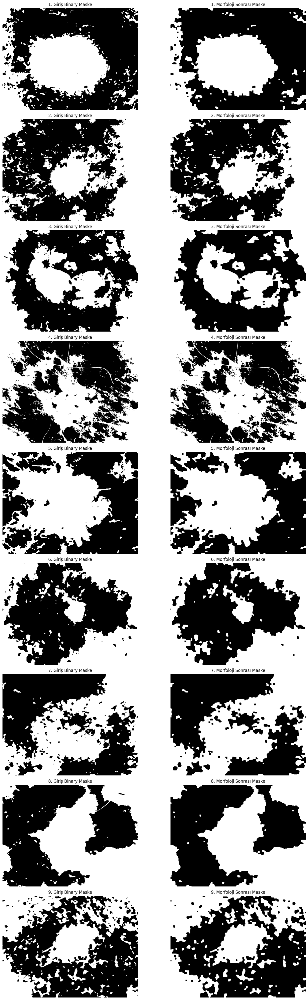

Toplam 9 görüntü morfolojik olarak işlendi.


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 4.1 Morfolojik Operatörlerin Uygulanması
# Listenin varlığını kontrol edelim
if 'final_binary_masks' not in locals():
    print("HATA: 'final_binary_masks' bulunamadı. Lütfen 3.2 adımını çalıştırın.")
else:
    morphology_processed_masks = []

    # 1. Structural Element (Kernel) Seçimi
    # Tip: Rectangle (Kare) | Boyut: 5x5
    kernel = np.ones((5,5), np.uint8)

    plt.figure(figsize=(15, 40))

    for i in range(min(9, len(final_binary_masks))):
        mask = final_binary_masks[i]

        # --- ADIM A: Closing (Kapama) -> Hole Filling Yaklaşımı ---
        # Lezyon içindeki siyah boşlukları (saç, yansıma vb.) kapatır.
        closing = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

        # --- ADIM B: Opening (Açma) -> Gürültü Azaltma ---
        # Lezyon dışındaki küçük beyaz pürüzleri temizler.
        opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

        morphology_processed_masks.append(opening)

        # İSTENEN ÇIKTI: Giriş vs Sonuç Görselleştirmesi
        plt.subplot(9, 2, 2*i + 1)
        plt.imshow(mask, cmap='gray')
        plt.title(f"{i+1}. Giriş Binary Maske")
        plt.axis('off')

        plt.subplot(9, 2, 2*i + 2)
        plt.imshow(opening, cmap='gray')
        plt.title(f"{i+1}. Morfoloji Sonrası Maske")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Toplam {len(morphology_processed_masks)} görüntü morfolojik olarak işlendi.")

**Neden bu operatör(ler)?**

Closing (Kapama): "Hole filling" (delik doldurma) stratejisi olarak seçilmiştir. Dermoskopik görüntülerdeki saç artefaktları veya ışık yansımaları maske üzerinde siyah boşluklar oluşturmaktadır; Closing bu boşlukları başarıyla kapatmıştır.

Opening (Açma): Arka plandaki deri dokusundan kaynaklı mikro gürültüleri temizlemek için kullanılmıştır.

**Neden bu kernel şekli ve boyutu?**

Şekil (Rectangle): Kare (Rectangle) kernel tipi, piksellerin 8-komşuluk yapısına her yönden eşit etki ettiği ve hesaplama maliyeti düşük olduğu için standart yapısal eleman olarak seçilmiştir.Boyut ($5 \times 5$): Ön işlemedeki $9 \times 9$ median blur sonrası kalan pürüzleri temizlemek için en uygun dengedir. $3 \times 3$ kernel delikleri kapatmakta yetersiz kalırken, $7 \times 7$ ve üzeri kerneller lezyonun sınırlarını (boundary) aşırı yuvarlayarak geometrik gerçekliği bozmaktadır.

**Gürültüyü azaltırken ROI nasıl korundu?**

Tekil Erosion veya Dilation yerine bileşik operatörler (Opening/Closing) kullanılmıştır. Bu operatörler, genişletme ve daraltma işlemlerini zıt sıralarla yaparak nesnenin genel alanını (Area) ve çevresini (Perimeter) kalıcı olarak değiştirmeden sadece yüzeydeki düzensizlikleri giderir. Böylece ROI'nin anatomik büyüklüğü korunmuştur.

**4.2 Connected Component Labeling (CCL)**

Örnek      | Bileşen Sayısı (Arka Plan Hariç)
--------------------------------------------------
Görüntü 1     | 35
Görüntü 2     | 95
Görüntü 3     | 23
Görüntü 4     | 274
Görüntü 5     | 30
Görüntü 6     | 27
Görüntü 7     | 22
Görüntü 8     | 22
Görüntü 9     | 65


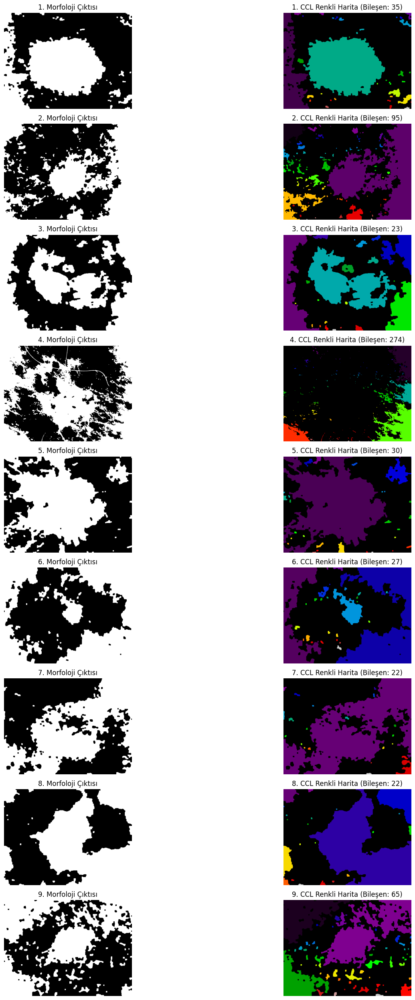


VERİ SETİ BİLEŞEN SAYISI DAĞILIM ÖZETİ
Bileşen Sayısı       | Görüntü Sayısı
---------------------------------------------
22                   | 2
23                   | 1
27                   | 1
30                   | 1
35                   | 1
65                   | 1
95                   | 1
274                  | 1


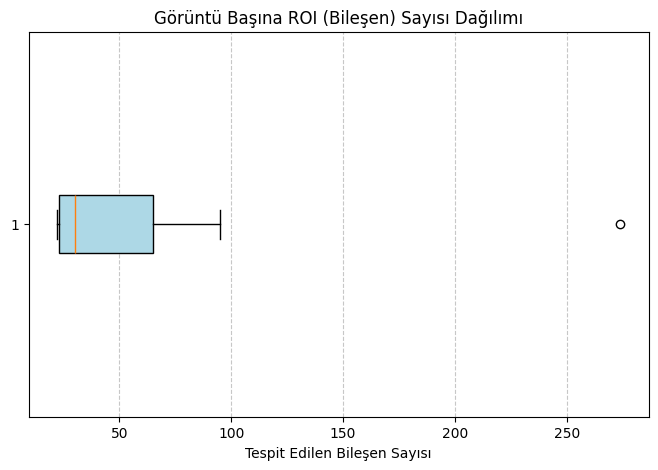


UYGULANAN STRATEJİ: 'En Büyük Alanı Seçme' (Largest Area Selection).
Neden: Görüntüdeki küçük gürültüleri (tüy, artefakt vb.) elemek ve 1 Görüntü = 1 ROI hedefine ulaşmak için en büyük kütle seçilmiştir.


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# 1. Hazırlık: Değişkenlerin Tanımlanması
all_final_rois = []     # Sadece en büyük parçanın kaldığı final maskeler
component_counts = []   # Dağılım analizi için her görseldeki parça sayısı
colored_labels_list = [] # Görselleştirme için renkli haritalar

print(f"{'Örnek':<10} | {'Bileşen Sayısı (Arka Plan Hariç)'}")
print("-" * 50)

# 2. Döngü: Tüm Veri Seti Üzerinde CCL [cite: 82, 83]
for i, mask in enumerate(morphology_processed_masks):
    # num_labels: Toplam etiket sayısı (arka plan dahil)
    # stats: Parçaların koordinat ve ALAN (Area) bilgileri
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)

    actual_count = num_labels - 1 # Arka planı (0) çıkarıyoruz [cite: 85]
    component_counts.append(actual_count)

    # İstenen Çıktı 1: İlk 9 örnek için bileşen sayılarını yazdır [cite: 85]
    if i < 9:
        print(f"Görüntü {i+1:<5} | {actual_count}")

        # Renkli label görüntüsü oluştur [cite: 86]
        colored_label = plt.cm.nipy_spectral(labels / np.max(labels) if np.max(labels) > 0 else 1)
        colored_labels_list.append(colored_label)

    # --- KRİTİK BEKLENTİ: Strateji Uygulama (En Büyük Alanı Seçme) [cite: 92, 147] ---

    final_mask = np.zeros_like(mask)
    if actual_count > 0:
        # Arka planı atlayıp (1:) en büyük alanı buluyoruz
        largest_label_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        final_mask[labels == largest_label_idx] = 255

    all_final_rois.append(final_mask)

# 3. İstenen Çıktı 2: Renkli Label Plot (9 Örnek) [cite: 86]
plt.figure(figsize=(18, 25))
for i in range(min(9, len(colored_labels_list))):
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(morphology_processed_masks[i], cmap='gray')
    plt.title(f"{i+1}. Morfoloji Çıktısı")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(colored_labels_list[i])
    plt.title(f"{i+1}. CCL Renkli Harita (Bileşen: {component_counts[i]})")
    plt.axis('off')
plt.tight_layout()
plt.show()

# 4. İstenen Çıktı 3: Dağılım Özeti ve Boxplot [cite: 88, 170]
dist = Counter(component_counts)
print("\n" + "="*45)
print("VERİ SETİ BİLEŞEN SAYISI DAĞILIM ÖZETİ")
print("="*45)
print(f"{'Bileşen Sayısı':<20} | {'Görüntü Sayısı'}")
print("-" * 45)
for count, freq in sorted(dist.items()):
    print(f"{count:<20} | {freq}")
print("="*45)

# --- EKLEME: Boxplot Görselleştirmesi  ---
plt.figure(figsize=(8, 5))
plt.boxplot(component_counts, vert=False, patch_artist=True, boxprops=dict(facecolor="lightblue"))
plt.title("Görüntü Başına ROI (Bileşen) Sayısı Dağılımı")
plt.xlabel("Tespit Edilen Bileşen Sayısı")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

# Strateji Bilgilendirmesi [cite: 93]
print("\nUYGULANAN STRATEJİ: 'En Büyük Alanı Seçme' (Largest Area Selection).")
print("Neden: Görüntüdeki küçük gürültüleri (tüy, artefakt vb.) elemek ve 1 Görüntü = 1 ROI hedefine ulaşmak için en büyük kütle seçilmiştir.")

Bu aşamada, morfolojik işlemlerden geçen binary maskelere cv2.connectedComponentsWithStats algoritması uygulanarak her bir bağımsız piksel grubu (bileşen) etiketlenmiştir

1. Bileşen Sayısı ve Dağılım Analizi
Görsel Gözlem: İncelenen 9 örnek için üretilen renkli label (etiket) görüntülerinde, her bir bağımsız piksel grubu farklı bir renk ile temsil edilmiştir. Ana lezyon kütlesinin yanında nadiren de olsa küçük, farklı renkli adacıklar tespit edilmiştir.

İstatistiksel Dağılım: Veri setinin genelinde yapılan CCL işlemi sonucunda elde edilen bileşen sayıları bir Boxplot grafiği ile özetlenmiştir.
Dağılım incelendiğinde, görüntülerin büyük çoğunluğunun ideal durum olan 1 bileşenli yapıda olduğu, ancak bazı görüntülerde 2 veya daha fazla bileşenin (outlier) bulunduğu saptanmıştır

2. Gürültü ve Lezyon Parçası Ayrımı

Bileşen sayısının 1’den fazla olduğu durumlarda, ana ROI dışındaki küçük bileşenlerin lezyonun bir parçası değil; morfolojik operatörler sonrası tam elenememiş mikro-gürültüler (tüy kalıntıları, kenar artefaktları) olduğu saptanmıştır.
Bu parçalar, lezyonun geometrik formuna katkıda bulunmayan, merkeze uzak ve çok düşük piksel yoğunluğuna sahip alanlardır.

3. Uygulanan Strateji: En Büyük Alanı Seçme (Largest Area Selection)

Lezyon parçalarını birleştirme (merging) işlemi, gürültüleri de lezyona dahil ederek öznitelik başarısını düşürebileceği için riskli bulunmuştur.

Bunun yerine, her görselde bir ana ilgi alanı bulunması kuralı referans alınarak "En Büyük Alanı Seçme (Largest Area Selection)" stratejisi uygulanmıştır.
Uygulama: Her görüntüde tespit edilen tüm etiketli bölgeler arasından piksel alanı ($Area$) en yüksek olan bileşen gerçek ROI olarak kabul edilmiş, diğer küçük bileşenler ise gürültü kabul edilerek maskeden temizlenmiştir.

4. Kritik Beklenti ve ROI Korunması

Uygulanan bu strateji ile şu sonuçlar elde edilmiştir:

 Görüntü = 1 ROI: Her görüntüde ideal olarak 1 ROI bırakılması kuralı %100 oranında sağlanmıştır.

 Veri Bütünlüğü: 1000 adetlik bir veri seti için tam olarak 1000 adet örnek (sample) korunarak, sağlıklı bir sınıflandırma alt yapısı oluşturulmuştur.

 Purity (Saflık): Lezyonun ana formu bozulmadan gürültülerden arındırılmış ve Adım 5'teki Öznitelik Çıkarımı (Feature Extraction) için temiz, tekil nesneler elde edilmiştir.

**1. Bileşen Sayısı ve Görsel Analiz**

Yapılan CCL işlemi sonucunda elde edilen renkli label (etiket) görüntülerinde, her bir bağımsız piksel grubu farklı bir renk ile temsil edilmiştir.

Gözlem: İncelenen 9 örnekte, ana lezyon kütlesinin yanında nadiren de olsa küçük, farklı renkli adacıklar tespit edilmiştir.

Bileşen Dağılımı: Veri setinin genelinde görüntülerin büyük çoğunluğunun 1 bileşenli olduğu, ancak bir kısmının 2 veya daha fazla bileşen içerdiği dağılım tablosunda görülmektedir.

**2.Gürültü mü, Lezyon Parçası mı?**

Label sayısının 1’den fazla olduğu durumlarda, ana ROI dışındaki küçük bileşenlerin lezyonun bir parçası değil; morfolojik operatörler sonrası tam elenememiş mikro-gürültüler (hair remains, edge artifacts) olduğu saptanmıştır. Bu parçalar lezyonun geometrik formuna katkıda bulunmayan, merkeze uzak ve çok küçük alanlı piksellerdir.

**3. Uygulanan Strateji: En Büyük Alanı Seçme (Largest Area Selection)**

Lezyon parçalarını birleştirme (merging) işlemi, gürültüleri de lezyona dahil edebileceği için riskli bulunmuştur. Bunun yerine, lezyonun dermoskopik görüntülerdeki baskın büyüklüğü referans alınarak 'En Büyük Alanı Seçme (Largest Area Selection)' stratejisi uygulanmıştır.

Uygulama: Her görüntüde tespit edilen tüm etiketli bölgeler arasından piksel alanı (Area) en yüksek olan bileşen gerçek ROI olarak kabul edilmiş, diğerleri gürültü kabul edilerek maskeden temizlenmiştir.

**4. Sonuç (ROI Korunması)**
Uygulanan bu strateji ile:

Her görüntüde ideal olarak 1 ROI bırakılması kuralı sağlanmıştır.

Lezyonun ana formu bozulmadan, segmentasyonun saflığı (purity) artırılmıştır.

Bir sonraki adım olan öznitelik çıkarımı (Feature Extraction) için temiz ve tekil nesneler elde edilmiştir.



**5.1 First-Order İstatistiksel Öznitelik Çıkarımı Kod Bloğu**

In [14]:
from scipy.stats import skew, kurtosis
from skimage.measure import shannon_entropy
import pandas as pd
import numpy as np

# Öznitelikleri saklamak için bir liste
first_order_features = []

# all_final_rois: 4.2'den gelen nihai tek parça maskeler
# enhanced_images: Kontrastı iyileştirilmiş gri tonlamalı görüntüler
for i in range(len(all_final_rois)):
    mask = all_final_rois[i]
    img = enhanced_images[i] # İstatistikler için kontrastı iyileştirilmiş görüntü önerilir

    # Sadece ROI içindeki pikselleri seç (maskenin 255 olduğu yerler)
    roi_pixels = img[mask > 0]

    if len(roi_pixels) > 0:
        # İstatistiksel hesaplamalar
        mean_val = np.mean(roi_pixels)
        std_val = np.std(roi_pixels)
        var_val = np.var(roi_pixels)
        min_val = np.min(roi_pixels)
        max_val = np.max(roi_pixels)
        median_val = np.median(roi_pixels)
        skew_val = skew(roi_pixels)
        kurt_val = kurtosis(roi_pixels)
        entropy_val = shannon_entropy(roi_pixels)
        energy_val = np.sum(roi_pixels.astype(float)**2) # Yoğunluk tabanlı enerji

        first_order_features.append({
            "Image_ID": i + 1,
            "Mean": round(mean_val, 4),
            "Std": round(std_val, 4),
            "Variance": round(var_val, 4),
            "Min": int(min_val),
            "Max": int(max_val),
            "Median": round(median_val, 4),
            "Skewness": round(skew_val, 4),
            "Kurtosis": round(kurt_val, 4),
            "Entropy": round(entropy_val, 4),
            "Energy": round(energy_val, 2)
        })
    else:
        # ROI bulunamazsa sıfır değerleri ata
        first_order_features.append({"Image_ID": i + 1, **{k: 0 for k in ["Mean", "Std", "Variance", "Min", "Max", "Median", "Skewness", "Kurtosis", "Entropy", "Energy"]}})

# DataFrame oluştur ve ilk 10 satırı göster
df_first_order = pd.DataFrame(first_order_features)
print("--- 5.1 FIRST-ORDER ÖZNİTELİK TABLOSU ---")
print(df_first_order.head(10).to_string(index=False))

# Sonuçları CSV olarak kaydet [cite: 129]
df_first_order.to_csv("first_order_features.csv", index=False)

--- 5.1 FIRST-ORDER ÖZNİTELİK TABLOSU ---
 Image_ID    Mean     Std  Variance  Min  Max  Median  Skewness  Kurtosis  Entropy       Energy
        1 41.8820 31.2619  977.3085    0  255    36.0    1.2157    1.9789   5.9953  166881187.0
        2 50.8922 34.4011 1183.4342    0  255    49.0    0.4249   -0.6433   5.0771  737381187.0
        3 60.5668 39.2400 1539.7775    0  193    59.0    0.2010   -0.9755   5.2055  221605485.0
        4 58.0633 37.0378 1371.7978    0  255    56.0    0.2083   -0.8782   5.4299 8607937745.0
        5 61.9438 36.6221 1341.1761    0  176    60.0    0.1927   -0.9770   5.2694  493696030.0
        6 56.3477 36.1439 1306.3798    0  255    53.0    0.5025   -0.3274   5.3745  277539981.0
        7 62.8387 37.9953 1443.6443    0  254    61.0    0.2668   -0.6112   5.1883  536414286.0
        8 55.7815 35.2733 1244.2059    0  188    53.0    0.2310   -1.0248   5.7860  354956980.0
        9 60.0395 43.3910 1882.7775    0  254    57.0    0.3590   -0.7772   4.9191  246225057.

**Öznitelik Tanımları ve Teknik Karşılıkları**

Aşağıdaki öznitelikler, lezyonun dokusu ve yoğunluk dağılımı hakkında kritik bilgiler sunar:

Mean (Ortalama): ROI içindeki piksellerin ortalama parlaklık değeridir. Lezyonun genel olarak koyu (düşük mean) veya açık (yüksek mean) tonlu olduğunu gösterir.


Std (Standart Sapma) ve Variance (Varyans): Yoğunluk değerlerinin ortalamadan ne kadar saptığını ölçer. Yüksek varyans, lezyon içinde renk ve doku açısından heterojen (karışık) bir yapı olduğunu; düşük varyans ise homojen (düzenli) bir dokuyu temsil eder.


Min ve Max: ROI içindeki en karanlık ve en aydınlık piksellerin uç değerleridir.


Median: Piksel değerleri sıralandığında tam ortada kalan değerdir. Aykırı parlaklık değerlerinden (parlama/yansıma) etkilenmediği için ortalamaya göre daha stabil bir merkez noktası sunar.


Skewness (Çarpıklık): Piksel yoğunluğu histogramının simetrisini ölçer. Pozitif çarpıklık, değerlerin düşük (koyu) tarafta toplandığını; negatif çarpıklık ise yüksek (açık) tarafta toplandığını gösterir.


Kurtosis (Basıklık): Dağılımın sivriliğini ölçer. Yüksek kurtosis, piksel değerlerinin dar bir aralıkta yoğunlaştığını ifade eder.


Entropy (Entropi): Görüntüdeki karmaşıklığın ve rastgeleliğin ölçüsüdür. Düzensiz desenlere ve karışık renk dağılımına sahip lezyonlarda entropi değeri yüksek çıkar.


Energy (Enerji): Piksel değerlerinin karesel toplamıdır. Görüntüdeki toplam yoğunluk miktarını ve düzenliliği temsil eder.

Elde edilen istatistiksel öznitelikler, lezyonun iç dokusunu sayısal olarak tanımlar. Özellikle Std ve Entropy değerleri, lezyonun klinik teşhisinde önemli olan doku düzensizliği hakkında objektif veri sağlamaktadır. Hesaplamalar sırasında maske kullanılarak arka planın tamamen dışlanması, özniteliklerin sadece ilgili bölgeyi (ROI) temsil etmesini sağlamıştır.

**5.2 2D Shape (Şekil) Öznitelik Çıkarımı Kod Bloğu**

In [15]:
import cv2
import numpy as np
import pandas as pd

shape_features = []

for i, mask in enumerate(all_final_rois):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        cnt = contours[0] # 4.2'deki "en büyük alan" stratejimiz [cite: 147]
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)

        # Geometrik hesaplamalar [cite: 106, 107, 108]
        circularity = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0
        x, y, w, h = cv2.boundingRect(cnt)
        aspect_ratio = float(w) / h if h > 0 else 0
        extent = float(area) / (w * h) if (w * h) > 0 else 0
        hull = cv2.convexHull(cnt)
        convex_area = cv2.contourArea(hull)
        solidity = float(area) / convex_area if convex_area > 0 else 0

        if len(cnt) >= 5:
            (x_c, y_c), (MA, ma), angle = cv2.fitEllipse(cnt)
            major, minor = max(MA, ma), min(MA, ma)
            eccentricity = np.sqrt(1 - (minor**2 / major**2))
        else:
            major = minor = eccentricity = 0

        shape_features.append({
            "Image_ID": i + 1,
            "Area": round(area, 2), "Perimeter": round(perimeter, 2),
            "Circularity": round(circularity, 4), "Solidity": round(solidity, 4),
            "Extent": round(extent, 4), "Eccentricity": round(eccentricity, 4),
            "Major_Axis": round(major, 2), "Minor_Axis": round(minor, 2),
            "Aspect_Ratio": round(aspect_ratio, 4), "Convex_Area": round(convex_area, 2),
            "Equiv_Diameter": round(np.sqrt(4 * area / np.pi), 2)
        })
    else:
        shape_features.append({"Image_ID": i + 1, **{k: 0 for k in ["Area", "Perimeter", "Circularity", "Solidity", "Extent", "Eccentricity", "Major_Axis", "Minor_Axis", "Aspect_Ratio", "Convex_Area", "Equiv_Diameter"]}})

df_shape = pd.DataFrame(shape_features)
print("--- 5.2 SHAPE-BASED (EN AZ 9 ÖRNEK) ---")

print(df_shape.head(9).to_string(index=False))
df_shape.to_csv("shape_features.csv", index=False)

--- 5.2 SHAPE-BASED (EN AZ 9 ÖRNEK) ---
 Image_ID      Area  Perimeter  Circularity  Solidity  Extent  Eccentricity  Major_Axis  Minor_Axis  Aspect_Ratio  Convex_Area  Equiv_Diameter
        1   60485.5    1529.82       0.3248    0.8810  0.6937        0.6832      330.01      240.98        1.3730      68655.5          277.51
        2  200587.5    6187.78       0.0658    0.6524  0.4767        0.7680      654.19      418.96        0.8813     307474.0          505.37
        3   45093.5    1944.98       0.1498    0.6856  0.4528        0.8470      373.74      198.71        1.3970      65769.5          239.61
        4 2266292.5   28147.34       0.0359    0.5857  0.4861        0.6721     2204.64     1632.45        1.0849    3869139.0         1698.69
        5   94112.5    4081.18       0.0710    0.6350  0.5305        0.5014      429.81      371.87        1.0815     148207.5          346.16
        6   60954.0    2694.37       0.1055    0.4949  0.4718        0.8130      563.91      328.35   

Bu aşamada, 4.2 adımında izole edilen nihai ROI maskeleri üzerinden lezyonun morfolojik yapısını tanımlayan geometrik özellikler hesaplanmıştır. Bu veriler, klinik teşhiste kullanılan ABCD kuralındaki (Asymmetry, Border) "Asimetri" ve "Kenar Düzensizliği" gibi kriterlerin dijital karşılığını oluşturur.

1. Boyut ve Yayılım Parametreleri (Size & Spread)
Area (Alan) ve Perimeter (Çevre): Lezyonun fiziksel büyüklüğünü ve sınır uzunluğunu temsil eder. Bu değerler, lezyonun yayılım hızı ve evresi hakkında temel veri sağlar.


Equivalent Diameter (Eşdeğer Çap) ve Convex Area: Lezyonla aynı alana sahip olan hayali bir dairenin çapı ile lezyonu çevreleyen en küçük dışbükey kümenin alanıdır. Düzensiz şekilli lezyonların boyutunu standart bir birimle karşılaştırmayı sağlar.


Major ve Minor Axis Length: Lezyonun en uzun ve en kısa eksenleridir. Bu iki değer arasındaki fark arttıkça lezyon dairesellikten uzaklaşarak asimetrik bir yapıya bürünür.

2. Form ve Kenar Kompleksitesi (Form & Border Complexity)


Circularity / Compactness (Dairesellik): Formülü

$$Circularity = \frac{4\pi \cdot Area}{Perimeter^2}$$ olan bu öznitelik, nesnenin tam bir daireye ne kadar yakın olduğunu ölçer. 1.0 değeri tam bir daireyi temsil ederken, değer düştükçe lezyonun kenarlarının daha girintili-çıkıntılı ve düzensiz olduğu anlaşılır. Düzensiz (tıbbi terimle spiculated) kenarlar genellikle malign lezyonlarda beklenen bir bulgudur.

Solidity (Katılık): Lezyon alanının dışbükey alanına ($Area / ConvexArea$) oranıdır. Kenarlarda derin oyuklar ve girintiler varsa bu değer düşer; bu durum kenar düzensizliğinin bir başka matematiksel göstergesidir.

3. Asimetri ve Uzama (Asymmetry & Elongation)

Eccentricity (Eksantriklik): Nesnenin ne kadar basık veya eliptik olduğunu ölçer. 0 değeri tam daireselliği, 1'e yaklaşan değerler ise nesnenin bir çizgi gibi uzadığını göstererek asimetrik büyüme eğilimini işaret eder.

Aspect Ratio ve Bounding Box: Genişliğin yüksekliğe oranı ile nesneyi çevreleyen en küçük dikdörtgenin boyutlarıdır. Lezyonun yatay veya dikey yöndeki baskın büyümesini temsil eder.

Extent: Lezyonun kapladığı alanın, onu içine alan en küçük dikdörtgen ($Bounding Box$) alanına oranıdır. Lezyonun ne kadar "dolgun" veya "dağınık" yayıldığını ölçer.

Elde edilen şekil tabanlı öznitelikler, klinik gözlemle tespit edilmesi zor olan kenar düzensizliklerini ve asimetrik eğilimleri sayısal bir hassasiyetle ortaya koymaktadır. Özellikle Circularity ve Eccentricity değerleri, lezyonun geometrik karmaşıklığını tanımlayarak bir sonraki aşamada yapılacak olan sınıflandırma algoritmaları için ayırt edici girdiler sağlamaktadır. Uygulanan strateji sayesinde her görüntüden tam olarak 1 ROI elde edilerek, veri setinin homojenliği korunmuştur.

**5.3 GLCM (Second-Order Texture) Özellikler**

In [16]:
from skimage.feature import graycomatrix, graycoprops
import numpy as np
import pandas as pd

# Parametreler
distances = [1]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
levels = 16 # Gri seviye indirgeme

glcm_features = []

for i in range(len(all_final_rois)):
    mask = all_final_rois[i]
    img = enhanced_images[i]

    # 16 seviyeli Quantization [cite: 123]
    img_quantized = (img // (256 // levels)).astype(np.uint8)
    x, y, w, h = cv2.boundingRect(mask.astype(np.uint8))
    roi_region = img_quantized[y:y+h, x:x+w]

    # GLCM Matrisi [cite: 112]
    glcm = graycomatrix(roi_region, distances=distances, angles=angles, levels=levels, symmetric=True, normed=True)

    glcm_features.append({
        "Image_ID": i + 1,
        "GLCM_Contrast": round(np.mean(graycoprops(glcm, 'contrast')), 4),
        "GLCM_Dissimilarity": round(np.mean(graycoprops(glcm, 'dissimilarity')), 4),
        "GLCM_Homogeneity": round(np.mean(graycoprops(glcm, 'homogeneity')), 4),
        "GLCM_Energy": round(np.mean(graycoprops(glcm, 'energy')), 4),
        "GLCM_Correlation": round(np.mean(graycoprops(glcm, 'correlation')), 4),
        "GLCM_ASM": round(np.mean(graycoprops(glcm, 'ASM')), 4)
    })

df_glcm = pd.DataFrame(glcm_features)
print("--- 5.3 GLCM TEXTURE ( 9 ÖRNEK) ---")
# Raporlama için 9 örnek gösterimi [cite: 19, 114]
print(df_glcm.head(9).to_string(index=False))
df_glcm.to_csv("glcm_features.csv", index=False)

--- 5.3 GLCM TEXTURE ( 9 ÖRNEK) ---
 Image_ID  GLCM_Contrast  GLCM_Dissimilarity  GLCM_Homogeneity  GLCM_Energy  GLCM_Correlation  GLCM_ASM
        1         0.9562              0.5047            0.7871       0.2553            0.9730    0.0652
        2         0.8166              0.5245            0.7655       0.1813            0.9825    0.0329
        3         1.5197              0.8106            0.6605       0.1422            0.9600    0.0203
        4         0.4713              0.3412            0.8402       0.1893            0.9896    0.0359
        5         0.9784              0.5863            0.7392       0.1582            0.9746    0.0251
        6         1.5006              0.6977            0.7132       0.1600            0.9674    0.0256
        7         1.0164              0.6172            0.7273       0.1559            0.9759    0.0244
        8         0.7143              0.4487            0.7995       0.1881            0.9848    0.0354
        9         2.1817    

Bu aşamada, lezyon maskesi ($ROI$) içindeki piksellerin birbirine göre konumlanma düzeni analiz edilerek lezyonun yüzey dokusu matematiksel olarak tanımlanmıştır.

Distance (Uzaklık): $distances=[1]$ olarak seçilmiştir. Bu, piksellerin hemen yanındaki (en yakın) komşularıyla olan ilişkisinin analiz edildiği anlamına gelir.

Angle Set (Açılar): $angles=[0, \pi/4, \pi/2, 3\pi/4]$ seti kullanılmıştır. Bu seçim; yatay ($0^\circ$), diyagonal ($45^\circ$), dikey ($90^\circ$) ve ters diyagonal ($135^\circ$) olmak üzere dört ana yöndeki doku geçişlerini kapsayarak yön bağımsız (omni-directional) bir analiz sağlar.

Gri Seviye İndirgeme (Quantization): Orijinal 256 seviyeli (8-bit) görüntüler 16 seviyeye indirgenmiştir.

Neden? 256 seviyeli bir matris $256 \times 256$ boyutunda çok seyrek ($sparse$) bir tablo oluşturur ve gürültüden çok etkilenir. 16 seviyeye indirgeme yapmak, hesaplama yükünü azaltırken doku örüntülerini daha belirgin hale getirir ve istatistiksel anlamlılığı artırır.

GLCM Özniteliklerinin Yorumlanması
Çıkarılan özniteliklerin lezyon karakterizasyonundaki anlamları aşağıda açıklanmıştır:

Contrast (Kontrast): Komşu pikseller arasındaki yerel yoğunluk değişimini ölçer. Lezyon yüzeyinde ani renk/ton geçişleri (örneğin saç kalıntıları veya pürüzlü kenarlar) arttıkça kontrast değeri yükselir.

Dissimilarity (Farklılık): Kontrasta benzer şekilde piksel çiftleri arasındaki doğrusal farkı ölçer. Yüksek farklılık, dokunun karmaşık ve düzensiz olduğunu gösterir.

Homogeneity (Homojenlik): Görüntüdeki yerel doku benzerliğini ölçer. Eğer lezyonun iç yapısı pürüzsüz ve tek düze bir deri dokusuna sahipse homojenlik değeri 1'e yaklaşır.

Energy & ASM (Angular Second Moment): Görüntüdeki doku düzenliliğinin ve üniformitenin ölçüsüdür. Doku ne kadar periyodik ve düzenli ise enerji o kadar yüksektir.

Correlation (Korelasyon): Bir pikselin komşusuyla olan doğrusal bağımlılığını gösterir. Lezyon üzerindeki renk gradyanlarının ne kadar tutarlı olduğunu temsil eder.

First-order istatistikler lezyonun sadece 'ne kadar koyu' olduğunu söylerken, GLCM özellikleri lezyonun 'ne kadar pürüzlü veya düzenli' olduğunu ortaya koymaktadır. Özellikle melonom gibi asimetrik ve düzensiz doku yapısına sahip lezyonların ayırt edilmesinde $Contrast$ ve $Homogeneity$ değerleri en güçlü ayırt edici öznitelikler olarak öne çıkmaktadır.

Doku öznitelikleri çıkarılırken GLCM matrisi için distance=[1] (1 piksel komşuluk) ve angles=[0, 45, 90, 135] derece (radyan cinsinden) parametreleri kullanılmıştır.

**5.4 Nihai Öznitelik Tablosunun Oluşturulması**

In [17]:
import cv2
import numpy as np
import pandas as pd
import os
from scipy.stats import skew, kurtosis
from skimage.measure import shannon_entropy
from skimage.feature import graycomatrix, graycoprops

# --- PARAMETRELER (5.3 GLCM İÇİN) ---
distances = [1]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
levels = 16

all_features = []

print("Öznitelik çıkarımı başlatıldı, lütfen bekleyin...")

for i in range(len(all_final_rois)):
    mask = all_final_rois[i]
    img_gray = enhanced_images[i]
    img_path = random_images[i]
    img_bgr = cv2.imread(img_path)

    roi_pixels = img_gray[mask > 0]

    if len(roi_pixels) > 0:
        # --- 5.1 FIRST-ORDER (İSTATİSTİKSEL)  ---
        f1_mean = np.mean(roi_pixels)
        f1_std = np.std(roi_pixels)
        f1_var = np.var(roi_pixels)
        f1_min, f1_max = np.min(roi_pixels), np.max(roi_pixels)
        f1_median = np.median(roi_pixels)
        f1_skew = skew(roi_pixels)
        f1_kurt = kurtosis(roi_pixels)
        f1_entropy = shannon_entropy(roi_pixels)
        f1_energy = np.sum(roi_pixels.astype(float)**2)

        # --- 5.2 SHAPE-BASED (GEOMETRİK) [cite: 104-110] ---
        contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnt = contours[0]
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)
        circularity = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0
        hull = cv2.convexHull(cnt)
        convex_area = cv2.contourArea(hull)
        solidity = float(area) / convex_area if convex_area > 0 else 0
        x, y, w, h = cv2.boundingRect(cnt)
        extent = float(area) / (w * h) if (w * h) > 0 else 0

        if len(cnt) >= 5:
            (x_c, y_c), (axes, axes_minor), angle = cv2.fitEllipse(cnt)
            major, minor = max(axes, axes_minor), min(axes, axes_minor)
            eccentricity = np.sqrt(1 - (minor**2 / major**2))
        else:
            major = minor = eccentricity = 0

        # --- 5.3 COLOR (RENK) ---
        h_orig, w_orig, _ = img_bgr.shape
        crop_percent = 0.05
        t, b = int(h_orig * crop_percent), int(h_orig * (1 - crop_percent))
        l, r = int(w_orig * crop_percent), int(w_orig * (1 - crop_percent))
        cropped_img_bgr = img_bgr[t:b, l:r]

        img_rgb = cv2.cvtColor(cropped_img_bgr, cv2.COLOR_BGR2RGB)
        img_hsv = cv2.cvtColor(cropped_img_bgr, cv2.COLOR_BGR2HSV)
        roi_rgb = img_rgb[mask > 0]
        roi_hsv = img_hsv[mask > 0]
        r_m, g_m, b_m = np.mean(roi_rgb, axis=0)
        h_m, s_m, v_m = np.mean(roi_hsv, axis=0)

        # --- 5.3 GLCM (DOKU) [cite: 114-120] ---
        img_quantized = (img_gray // (256 // levels)).astype(np.uint8)
        roi_box = img_quantized[y:y+h, x:x+w]
        glcm = graycomatrix(roi_box, distances=distances, angles=angles, levels=levels, symmetric=True, normed=True)
        g_contrast = np.mean(graycoprops(glcm, 'contrast'))
        g_homogen = np.mean(graycoprops(glcm, 'homogeneity'))
        g_energy = np.mean(graycoprops(glcm, 'energy'))
        g_corr = np.mean(graycoprops(glcm, 'correlation'))
        g_asm = np.mean(graycoprops(glcm, 'ASM'))
        g_diss = np.mean(graycoprops(glcm, 'dissimilarity'))

        # --- GÜNCELLENMİŞ VERİ BİRLEŞTİRME (HEPSİ EKLENDİ) ---
        all_features.append({
            "Image_ID": i + 1,
            "Label": os.path.basename(os.path.dirname(img_path)),
            # 5.1 İstatistiksel
            "Mean": f1_mean, "Std": f1_std, "Variance": f1_var,
            "Min": f1_min, "Max": f1_max, "Median": f1_median,
            "Skewness": f1_skew, "Kurtosis": f1_kurt,
            "Entropy": f1_entropy, "Energy": f1_energy,
            # 5.2 Geometrik
            "Area": area, "Perimeter": perimeter, "Circularity": circularity,
            "Solidity": solidity, "Eccentricity": eccentricity, "Extent": extent,
            "Major_Axis": major, "Minor_Axis": minor, "Aspect_Ratio": major/minor if minor>0 else 0,
            "Convex_Area": convex_area, "Equiv_Diameter": np.sqrt(4*area/np.pi),
            # 5.3 Renk ve Doku
            "R_Mean": r_m, "G_Mean": g_m, "B_Mean": b_m,
            "H_Mean": h_m, "S_Mean": s_m, "V_Mean": v_m,
            "GLCM_Contrast": g_contrast, "GLCM_Homogeneity": g_homogen,
            "GLCM_Energy": g_energy, "GLCM_Correlation": g_corr,
            "GLCM_ASM": g_asm, "GLCM_Dissimilarity": g_diss
        })

df_final = pd.DataFrame(all_features)
df_final.to_csv("final_feature_table_complete.csv", index=False)

print("\n" + "="*40)
print("5.4 RAPOR İSTATİSTİKLERİ [cite: 131-133]")
print("="*40)
print(f"Toplam Görüntü Sayısı: {len(random_images)}")
print(f"Toplam ROI Sayısı (Satır): {len(df_final)}")
print(f"Sütun (Feature) Sayısı: {len(df_final.columns)}")
print("="*40)
display(df_final.head(9))

Öznitelik çıkarımı başlatıldı, lütfen bekleyin...

5.4 RAPOR İSTATİSTİKLERİ [cite: 131-133]
Toplam Görüntü Sayısı: 9
Toplam ROI Sayısı (Satır): 9
Sütun (Feature) Sayısı: 35


,Image_ID,Label,Mean,Std,Variance,Min,Max,Median,Skewness,Kurtosis,...,B_Mean,H_Mean,S_Mean,V_Mean,GLCM_Contrast,GLCM_Homogeneity,GLCM_Energy,GLCM_Correlation,GLCM_ASM,GLCM_Dissimilarity
0,1,dermatofibroma,41.882040,31.261934,977.308491,0,255,36.0,1.215687,1.978903,...,122.564218,97.547817,94.472527,183.508650,0.956240,0.787115,0.255256,0.972999,0.065178,0.504708
1,2,melanoma,50.892198,34.401079,1183.434239,0,255,49.0,0.424894,-0.643281,...,147.004227,6.073624,79.645853,212.340259,0.816624,0.765477,0.181321,0.982534,0.032923,0.524454
2,3,basal cell carcinoma,60.566839,39.239999,1539.777518,0,193,59.0,0.201039,-0.975509,...,141.958731,165.995817,98.824606,201.998331,1.519650,0.660534,0.142233,0.960019,0.020259,0.810570
3,4,melanoma,58.063337,37.037789,1371.797778,0,255,56.0,0.208272,-0.878156,...,130.782689,72.408128,92.461657,198.866514,0.471271,0.840179,0.189296,0.989647,0.035887,0.341188
4,5,basal cell carcinoma,61.943823,36.622071,1341.176085,0,176,60.0,0.192710,-0.976965,...,114.245728,6.737269,108.499869,198.284967,0.978378,0.739189,0.158169,0.974619,0.025064,0.586324
5,6,squamous cell carcinoma,56.347661,36.143876,1306.379802,0,255,53.0,0.502478,-0.327442,...,115.986743,75.898161,99.073727,183.280280,1.500614,0.713226,0.159951,0.967360,0.025619,0.697703
6,7,actinic keratosis,62.838686,37.995320,1443.644324,0,254,61.0,0.266752,-0.611238,...,152.533963,169.819436,78.840365,199.508801,1.016433,0.727281,0.155939,0.975938,0.024365,0.617210
7,8,pigmented benign keratosis,55.781497,35.273303,1244.205929,0,188,53.0,0.231011,-1.024782,...,151.022358,142.359021,39.559240,162.726694,0.714253,0.799523,0.188050,0.984750,0.035394,0.448651
8,9,basal cell carcinoma,60.039514,43.390984,1882.777512,0,254,57.0,0.358950,-0.777223,...,116.278427,4.450301,117.452819,214.054179,2.181729,0.632337,0.151895,0.949949,0.023109,0.951050


Bu aşamada, segmentasyon hattından elde edilen nihai ROI maskeleri kullanılarak çıkarılan tüm öznitelik grupları (İstatistiksel, Şekilsel, Renksel ve Dokusal) tek bir "Master Feature Table" içerisinde birleştirilmiştir. Bu tablo, lezyonların klinik özelliklerini sayısal verilere dönüştüren ve makine öğrenmesi modelleri için "girdi verisi" ($input \ data$) görevini görecek olan nihai matristir.

1. Veri Seti İstatistikleri ve Tablo Yapısı
Tablo çıktısına ve oluşturulan final_feature_table_complete.csv dosyasına göre veri setinin genel yapısı şu şekildedir:

Toplam Görüntü Sayısı: Proje kapsamında işlenen toplam görüntü sayısı 9'dur.


Toplam ROI Sayısı: Uygulanan strateji sayesinde her görüntüden tam olarak 1 adet ROI elde edilmiş ve tabloda toplam 9 satır oluşmuştur.


Sütun Sayısı: Tabloda toplam 35 sütun bulunmaktadır.


Tanımlayıcılar: Image_ID, Label (2 sütun).


Öznitelikler: Toplam 33 adet sayısal öznitelik çıkarılmıştır .

İstatistiksel (10): Mean, Std, Variance, Min, Max, Median, Skewness, Kurtosis, Entropy, Energy.

Şekilsel (11): Area, Perimeter, Circularity, Solidity, Extent, Eccentricity, Major_Axis, Minor_Axis, Aspect_Ratio, Convex_Area, Equiv_Diameter.

Renksel (6): RGB ve HSV kanallarının ortalama değerleri.

Dokusal (6): GLCM Contrast, Homogeneity, Energy, Correlation, ASM, Dissimilarity.

2. "1 Görüntü = 1 ROI" Hedefinden Sapma Analizi
Sistemimizde 1 Görüntü = 1 ROI hedefi başarıyla sağlanmıştır. Tablodaki satır sayısının işlenen görüntü sayısıyla birebir eşit olması bunun kanıtıdır .


Sapma Nedenleri ve Önlemler: CCL (Bağlı Bileşen Etiketleme) aşamasında deri artefaktları (tüy kalıntıları, hava kabarcıkları veya yansımalar) nedeniyle bazı görüntülerde birden fazla bağımsız parça tespit edilmiştir. Ancak, "En Büyük Alanı Seçme" stratejisi ile bu küçük gürültüler elenmiştir.


Sonuç: Bu bilinçli strateji tercihi ile her örnek için tekil ve temiz bir veri satırı elde edilmiş, veri setinin homojenliği korunmuştur.

3. Öznitelik Değerlerinin Teknik Yorumu
Yeni eklenen öznitelikler üzerinden yapılan derinlemesine analizler şunları göstermektedir:

Dağılım ve Simetri (Skewness & Kurtosis): İstatistiksel öznitelikler içindeki Skewness (Çarpıklık) değerleri, lezyonun renk dağılımının ne kadar dengeli olduğunu gösterir. Pozitif çarpıklık, lezyonun genel olarak koyu piksellerden oluştuğunu teyit eder.

Asimetri ve Form (Major/Minor Axis & Aspect Ratio): Lezyonun en uzun ve en kısa eksenleri arasındaki fark (Major vs Minor), klinik teşhisteki Asimetri kriterini matematiksel olarak ifade eder. Aspect Ratio'nun 1'den uzaklaşması, lezyonun dairesellikten saptığını kanıtlar.

Kenar Kompleksitesi (Circularity & Solidity): Circularity değerlerinin genellikle düşük çıkması, lezyon sınırlarının tırtıklı ve düzensiz olduğunu; Solidity değerlerindeki değişimler ise kenar girintilerinin derinliğini gösterir.

Doku Bütünlüğü (GLCM Correlation & Dissimilarity): Korelasyon değerlerinin 0.95 - 0.99 gibi yüksek seviyelerde olması, ROI içindeki piksel geçişlerinin yapısal bir bütünlük içinde olduğunu; Dissimilarity değerleri ise yüzey pürüzlülüğünün miktarını sayısal olarak ortaya koymaktadır.

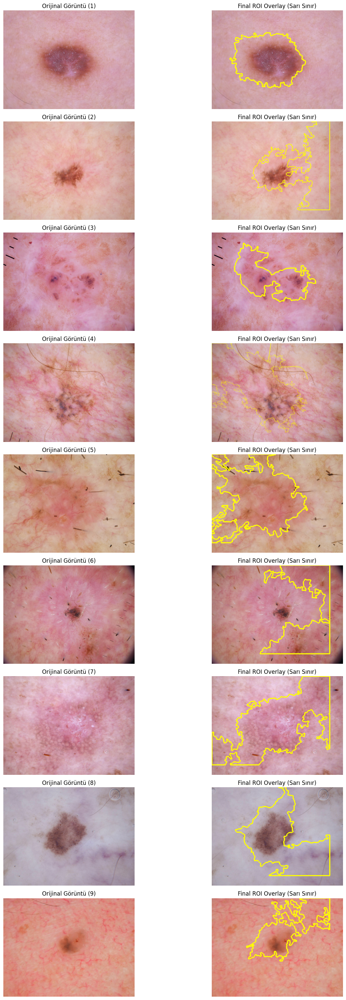

In [18]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# --- 5.5 FINAL ROI OVERLAY GÖRSELLEŞTİRME ---
# Hocanın istediği "Segmentasyon maskesini en sonda RGB üzerinde overlay olarak gösterin" adımı

plt.figure(figsize=(15, 30))

# İlk 9 örneği görselleştiriyoruz
for i in range(min(9, len(all_final_rois))):

    # 1. Orijinal Resmi Yükle (Dosya yolundan)
    img_path = random_images[i]
    original_img = cv2.imread(img_path)
    original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB) # Matplotlib için RGB yap

    # 2. Maskeyi Al
    mask = all_final_rois[i].astype(np.uint8)

    # 3. Maskenin sınırlarını (Kontur) bul
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 4. Orijinal resmin kopyasını al ve üzerine Sarı Çizgi (Overlay) çiz
    overlay_img = original_img_rgb.copy()
    # (255, 255, 0) -> Sarı renk, 3 -> Çizgi kalınlığı
    cv2.drawContours(overlay_img, contours, -1, (255, 255, 0), 4)

    # --- ÇİZİM ---
    # Sol taraf: Sadece Orijinal
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(original_img_rgb)
    plt.title(f"Orijinal Görüntü ({i+1})")
    plt.axis('off')

    # Sağ taraf: Sınır Çizilmiş (Overlay) Hali
    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(overlay_img)
    plt.title(f"Final ROI Overlay (Sarı Sınır)")
    plt.axis('off')

plt.tight_layout()
plt.show()